In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from keras import optimizers
from sklearn.metrics import mean_squared_error

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [4]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [5]:
def plot_curve(history):
    print('Last train loss: %s'%history.history['loss'][-1])
    print('Last validation loss: %s'%history.history['val_loss'][-1])
    
    # loss curves
    plt.figure(figsize=[8,6])

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(loss) + 1)

    # Plot loss
    plt.plot(epochs, loss, 'c--', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [6]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [7]:
cloud_cover = preparedata('../succeed-prophet/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


# Train/Test Model ,lags = 15

In [8]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,15)

X_train Shape : (14753, 15, 1)
y_train Shape : (14753, 1)
X_test Shape :  (293, 15, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [9]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### Add frist layer: units = 50

In [10]:
test1 = test.copy()

In [11]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 9s 11ms/step - loss: 0.0080 - accuracy: 0.0087 - val_loss: 0.0057 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0027 - accuracy: 0.0088 - val_loss: 0.0041 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0035 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0020 - 

Last train loss: 0.0012018519919365644
Last validation loss: 0.0018673969898372889
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


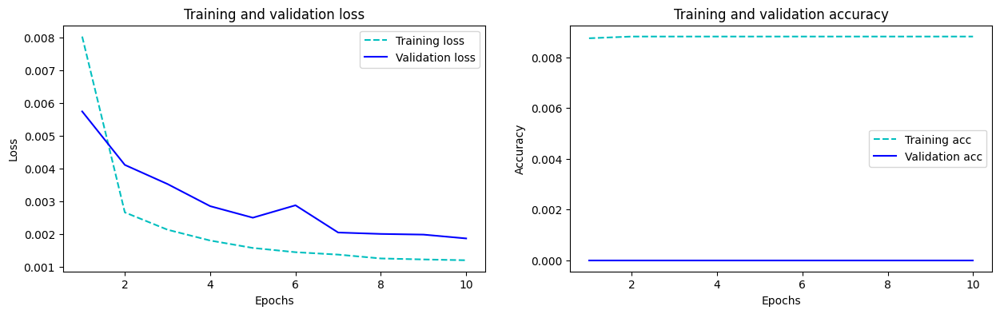

In [12]:
plot_curve(hist_adam)

In [13]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.323865
1,2021-12-16 09:11:00,0.112,0.145200
2,2021-12-16 09:12:00,0.116,0.116782
3,2021-12-16 09:13:00,0.112,0.117526
4,2021-12-16 09:14:00,0.099,0.114210
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715
289,2021-12-16 13:59:00,0.169,0.164358
290,2021-12-16 14:00:00,0.147,0.165085
291,2021-12-16 14:01:00,0.145,0.147931


In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [15]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.0018580718918671001

In [26]:
mse_data = pd.DataFrame(columns=['Model' ,'LSTM lag15'])
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 adam', lstm_mse_error_unit_50_adam]
mse_data

,Model,LSTM lag15
0,Lstm mse error unit 50 adam,0.001858


----------------------------------------------------------------------------------

## optimizer sgd

### Add frist layer: units = 50

In [16]:
model_50_sgd = Sequential()
model_50_sgd.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_sgd.add(Dense(units = 1))
model_50_sgd.compile(optimizer = 'sgd', loss = 'mean_squared_error')
hist_50_sgd = model_50_sgd.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 9ms/step - loss: 0.0166 - accuracy: 0.0083 - val_loss: 0.0055 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0057 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0053 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0052 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0051 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0027 - accuracy: 0.0088 - val_loss: 0.0051 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0027 - accuracy: 0.0088 - val_loss: 0.0050 - val

Last train loss: 0.002553499536588788
Last validation loss: 0.004761329386383295
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


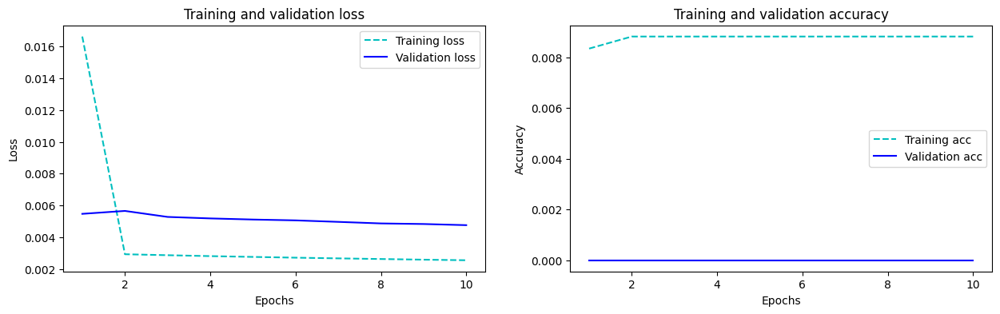

In [17]:
plot_curve(hist_50_sgd)

In [18]:
predict_scaled_50_sgd = model_50_sgd.predict(X_test)
predict_50_sgd = sc.inverse_transform(predict_scaled_50_sgd)
test1['LSTM_50_sgd'] = predict_50_sgd
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd
0,2021-12-16 09:10:00,0.111,0.323865,0.311874
1,2021-12-16 09:11:00,0.112,0.145200,0.270449
2,2021-12-16 09:12:00,0.116,0.116782,0.236711
3,2021-12-16 09:13:00,0.112,0.117526,0.210065
4,2021-12-16 09:14:00,0.099,0.114210,0.187714
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.173816
289,2021-12-16 13:59:00,0.169,0.164358,0.172967
290,2021-12-16 14:00:00,0.147,0.165085,0.172527
291,2021-12-16 14:01:00,0.145,0.147931,0.167480


In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_sgd'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [20]:
lstm_mse_error_unit_50_sgd = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_sgd'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_sgd)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.004738


In [27]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 sgd', lstm_mse_error_unit_50_sgd]

----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 50

In [21]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 8ms/step - loss: 0.0055 - accuracy: 0.0088 - val_loss: 0.0032 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0032 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val

Last train loss: 0.0012052598176524043
Last validation loss: 0.0018762063700705767
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


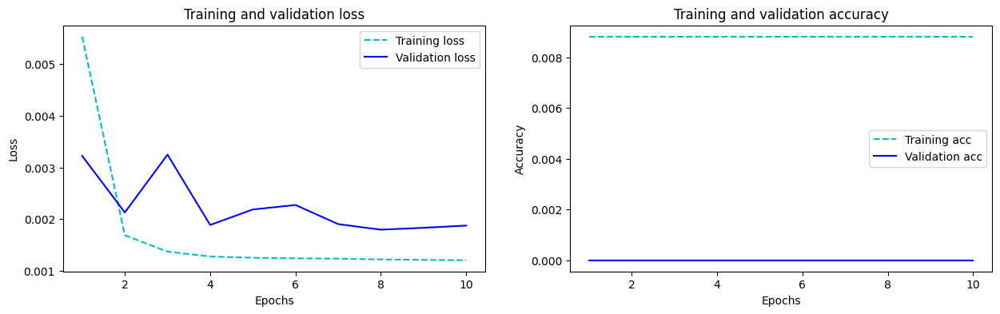

In [22]:
plot_curve(hist_50_rms)

In [23]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.323865,0.311874,0.329559
1,2021-12-16 09:11:00,0.112,0.145200,0.270449,0.131133
2,2021-12-16 09:12:00,0.116,0.116782,0.236711,0.123636
3,2021-12-16 09:13:00,0.112,0.117526,0.210065,0.126086
4,2021-12-16 09:14:00,0.099,0.114210,0.187714,0.121277
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.173816,0.170449
289,2021-12-16 13:59:00,0.169,0.164358,0.172967,0.170323
290,2021-12-16 14:00:00,0.147,0.165085,0.172527,0.171182
291,2021-12-16 14:01:00,0.145,0.147931,0.167480,0.151085


In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [25]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.001867


In [28]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 rmsprop', lstm_mse_error_unit_50_rms]

In [29]:
mse_data

,Model,LSTM lag15
0,Lstm mse error unit 50 adam,0.001858
1,Lstm mse error unit 50 sgd,0.004738
2,Lstm mse error unit 50 rmsprop,0.001867


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [30]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 6s 13ms/step - loss: 0.0136 - accuracy: 0.0083 - val_loss: 0.0079 - val_accuracy: 0.0000e+00
Epoch 2/10
231/231 [==============================] - 2s 9ms/step - loss: 0.0036 - accuracy: 0.0088 - val_loss: 0.0058 - val_accuracy: 0.0000e+00
Epoch 3/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0048 - val_accuracy: 0.0000e+00
Epoch 4/10
231/231 [==============================] - 2s 10ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.0040 - val_accuracy: 0.0000e+00
Epoch 5/10
231/231 [==============================] - 2s 10ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0035 - val_accuracy: 0.0000e+00
Epoch 6/10
231/231 [==============================] - 2s 9ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 7/10
231/231 [==============================] - 2s 10ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0029 -

Last train loss: 0.001395402941852808
Last validation loss: 0.002195217413827777
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


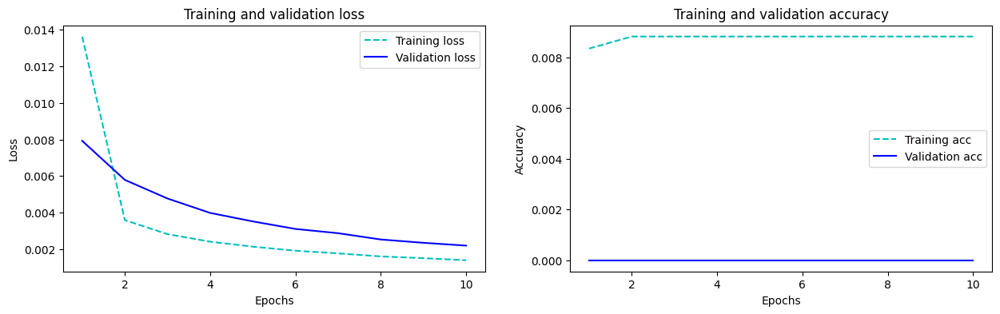

In [31]:
plot_curve(hist_batch_size64)

In [32]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.323865,0.311874,0.329559,0.330672
1,2021-12-16 09:11:00,0.112,0.145200,0.270449,0.131133,0.213341
2,2021-12-16 09:12:00,0.116,0.116782,0.236711,0.123636,0.145040
3,2021-12-16 09:13:00,0.112,0.117526,0.210065,0.126086,0.118568
4,2021-12-16 09:14:00,0.099,0.114210,0.187714,0.121277,0.109855
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.173816,0.170449,0.171756
289,2021-12-16 13:59:00,0.169,0.164358,0.172967,0.170323,0.171415
290,2021-12-16 14:00:00,0.147,0.165085,0.172527,0.171182,0.171782
291,2021-12-16 14:01:00,0.145,0.147931,0.167480,0.151085,0.161063


In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [34]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.002184


In [35]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 batch_size64', lstm_mse_error_batch_size64]

---

### learning rate 0.1

In [36]:
test2 = test.copy()

#### Add frist layer: units = 50

In [37]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 10ms/step - loss: 0.0627 - accuracy: 0.0087 - val_loss: 0.0087 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0048 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0044 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0037 - accuracy: 0.0088 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0038 - accuracy: 0.0088 - val_loss: 0.0052 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0040 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0041 - accuracy: 0.0088 - val_loss: 0.0139 - v

Last train loss: 0.0038059784565120935
Last validation loss: 0.0024129750672727823
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


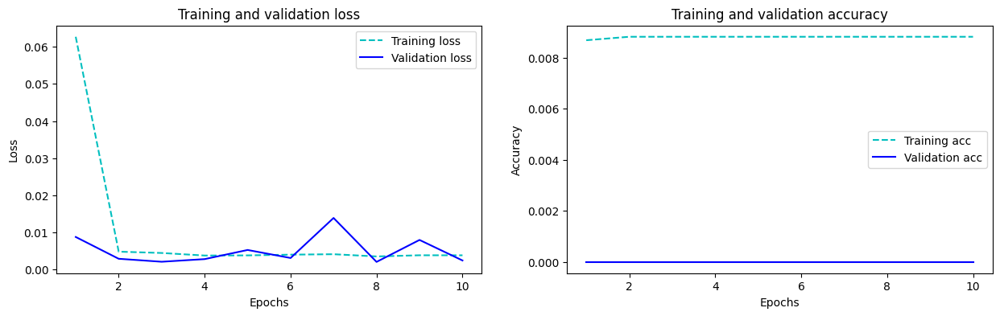

In [38]:
plot_curve(hist_01)

In [39]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.347186
1,2021-12-16 09:11:00,0.112,0.072814
2,2021-12-16 09:12:00,0.116,0.120458
3,2021-12-16 09:13:00,0.112,0.116438
4,2021-12-16 09:14:00,0.099,0.112600
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169835
289,2021-12-16 13:59:00,0.169,0.170425
290,2021-12-16 14:00:00,0.147,0.171609
291,2021-12-16 14:01:00,0.145,0.143463


In [40]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [41]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.002401


In [72]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.1', lstm_mse_error_unit_50_01]

----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [42]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 10ms/step - loss: 0.0447 - accuracy: 0.0083 - val_loss: 0.0418 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0031 - accuracy: 0.0088 - val_loss: 0.0042 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0038 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0030 - accuracy: 0.0088 - val_loss: 0.0037 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0031 - accuracy: 0.0088 - val_loss: 0.0059 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0026 - accuracy: 0.0088 - val_loss: 0.0068 - va

Last train loss: 0.0021279477514326572
Last validation loss: 0.00394329521805048
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


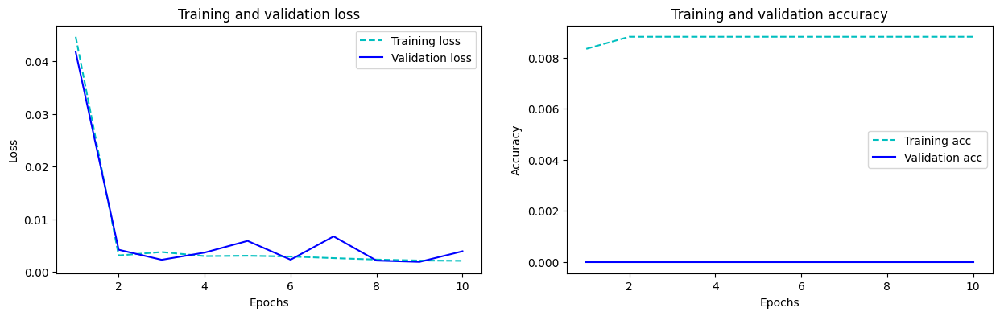

In [43]:
plot_curve(hist_005)

In [44]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.347186,0.289952
1,2021-12-16 09:11:00,0.112,0.072814,0.046031
2,2021-12-16 09:12:00,0.116,0.120458,0.060979
3,2021-12-16 09:13:00,0.112,0.116438,0.066141
4,2021-12-16 09:14:00,0.099,0.112600,0.061342
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169835,0.120402
289,2021-12-16 13:59:00,0.169,0.170425,0.120559
290,2021-12-16 14:00:00,0.147,0.171609,0.121725
291,2021-12-16 14:01:00,0.145,0.143463,0.096343


In [45]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [46]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.003924


In [73]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.05', lstm_mse_error_unit_50_005]

----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [57]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 9ms/step - loss: 0.0035 - accuracy: 0.0087 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val

Last train loss: 0.0012119323946535587
Last validation loss: 0.0018732215976342559
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


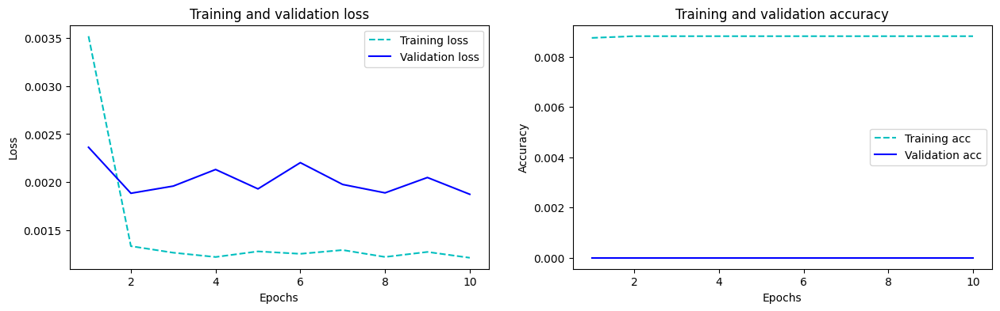

In [58]:
plot_curve(hist_001)

In [59]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.347186,0.289952,0.330448,0.333094
1,2021-12-16 09:11:00,0.112,0.072814,0.046031,0.130608,0.130828
2,2021-12-16 09:12:00,0.116,0.120458,0.060979,0.129186,0.110321
3,2021-12-16 09:13:00,0.112,0.116438,0.066141,0.128575,0.117540
4,2021-12-16 09:14:00,0.099,0.112600,0.061342,0.123359,0.116885
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169835,0.120402,0.175551,0.171817
289,2021-12-16 13:59:00,0.169,0.170425,0.120559,0.175584,0.171613
290,2021-12-16 14:00:00,0.147,0.171609,0.121725,0.176456,0.172539
291,2021-12-16 14:01:00,0.145,0.143463,0.096343,0.155614,0.152240


In [60]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [61]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.001864


In [74]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.01', lstm_mse_error_001]

----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [62]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 9ms/step - loss: 0.0032 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0011780539061874151
Last validation loss: 0.0019322462612763047
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


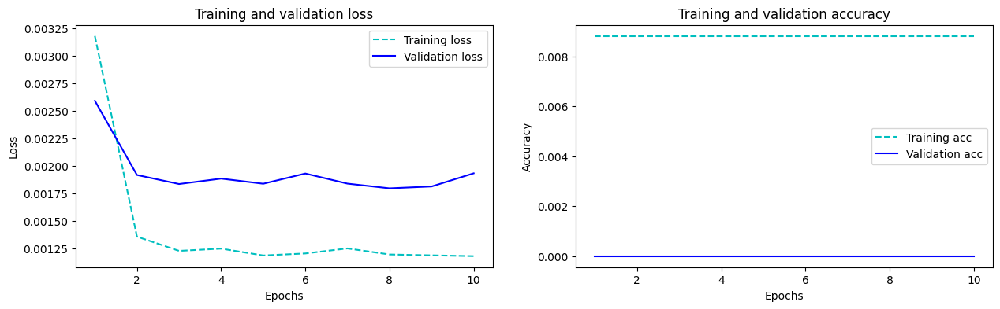

In [63]:
plot_curve(hist_0005)

In [64]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.347186,0.289952,0.330448,0.335745
1,2021-12-16 09:11:00,0.112,0.072814,0.046031,0.130608,0.139869
2,2021-12-16 09:12:00,0.116,0.120458,0.060979,0.129186,0.126311
3,2021-12-16 09:13:00,0.112,0.116438,0.066141,0.128575,0.128093
4,2021-12-16 09:14:00,0.099,0.112600,0.061342,0.123359,0.124630
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169835,0.120402,0.175551,0.178949
289,2021-12-16 13:59:00,0.169,0.170425,0.120559,0.175584,0.178856
290,2021-12-16 14:00:00,0.147,0.171609,0.121725,0.176456,0.179731
291,2021-12-16 14:01:00,0.145,0.143463,0.096343,0.155614,0.159924


In [65]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [66]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.001923


In [75]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.005', lstm_mse_error_unit_50_0005]

----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [67]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 9ms/step - loss: 0.0112 - accuracy: 0.0087 - val_loss: 0.0055 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0026 - accuracy: 0.0088 - val_loss: 0.0040 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val

Last train loss: 0.0011993244988843799
Last validation loss: 0.002016832586377859
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


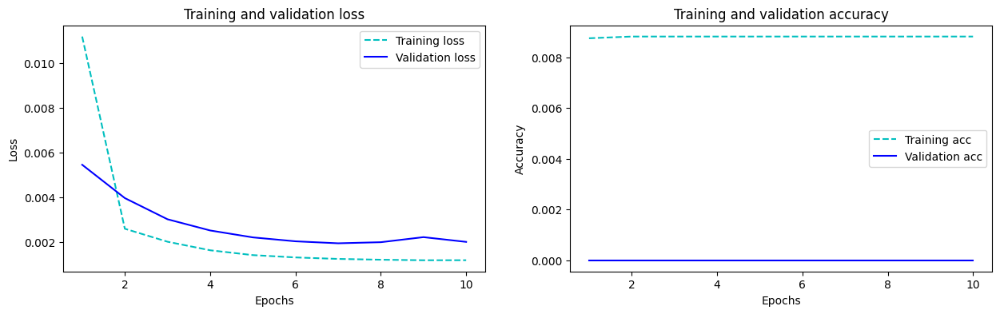

In [68]:
plot_curve(hist_0001)

In [69]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.347186,0.289952,0.330448,0.335745,0.330448
1,2021-12-16 09:11:00,0.112,0.072814,0.046031,0.130608,0.139869,0.130608
2,2021-12-16 09:12:00,0.116,0.120458,0.060979,0.129186,0.126311,0.129186
3,2021-12-16 09:13:00,0.112,0.116438,0.066141,0.128575,0.128093,0.128575
4,2021-12-16 09:14:00,0.099,0.112600,0.061342,0.123359,0.124630,0.123359
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169835,0.120402,0.175551,0.178949,0.175551
289,2021-12-16 13:59:00,0.169,0.170425,0.120559,0.175584,0.178856,0.175584
290,2021-12-16 14:00:00,0.147,0.171609,0.121725,0.176456,0.179731,0.176456
291,2021-12-16 14:01:00,0.145,0.143463,0.096343,0.155614,0.159924,0.155614


In [70]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [71]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_0001)

Better MSE value is :  0.0018580718918671001


,Model,MSE error
0,model,0.001858
1,model_1,0.001864


In [76]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.001', lstm_mse_error_0001]

----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [77]:
test3 = test.copy()

In [78]:
test3['LSTM_50'] = predict_adam

In [84]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 9s 12ms/step - loss: 0.0046 - accuracy: 0.0088 - val_loss: 0.0041 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.001

Last train loss: 0.001161288470029831
Last validation loss: 0.0018083853647112846
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


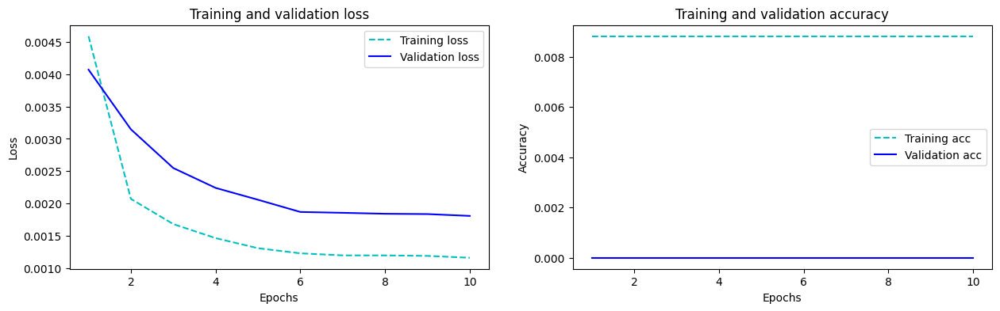

In [85]:
plot_curve(hist_1)

In [86]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.323865,0.328404
1,2021-12-16 09:11:00,0.112,0.145200,0.129802
2,2021-12-16 09:12:00,0.116,0.116782,0.116233
3,2021-12-16 09:13:00,0.112,0.117526,0.118118
4,2021-12-16 09:14:00,0.099,0.114210,0.114773
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.169692
289,2021-12-16 13:59:00,0.169,0.164358,0.169528
290,2021-12-16 14:00:00,0.147,0.165085,0.170405
291,2021-12-16 14:01:00,0.145,0.147931,0.150877


In [87]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [88]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_100)

Better MSE value is :  0.0017993547200843292


,Model,MSE error
0,model,0.001858
1,model_1,0.001799


In [119]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam frist layer unit 100', lstm_mse_error_unit_100]

------------

### Add frist layer: units = 200

In [89]:
model_6 = Sequential()
model_6.add(LSTM(units = 200, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_6.add(Dense(units = 1))
model_6.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_6= model_6.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 23s 32ms/step - loss: 0.0055 - accuracy: 0.0088 - val_loss: 0.0043 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 9s 20ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0044 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 9s 19ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 9s 20ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 9s 20ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 9s 19ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 9s 20ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0012002134462818503
Last validation loss: 0.0018288413994014263
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


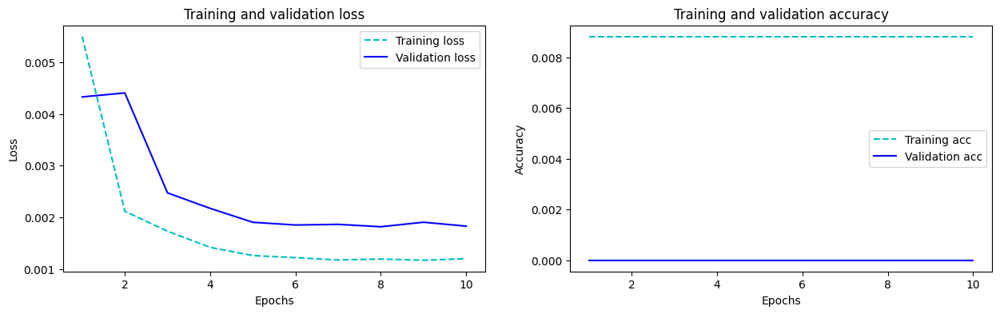

In [90]:
plot_curve(hist_6)

In [91]:
predict_scaled_6 = model_6.predict(X_test)
predict_6 = sc.inverse_transform(predict_scaled_6)
test3['LSTM_200'] = predict_6
test3

10/10 [==============================] - 1s 9ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_200
0,2021-12-16 09:10:00,0.111,0.323865,0.328404,0.326759
1,2021-12-16 09:11:00,0.112,0.145200,0.129802,0.130307
2,2021-12-16 09:12:00,0.116,0.116782,0.116233,0.110283
3,2021-12-16 09:13:00,0.112,0.117526,0.118118,0.113003
4,2021-12-16 09:14:00,0.099,0.114210,0.114773,0.111251
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.169692,0.166310
289,2021-12-16 13:59:00,0.169,0.164358,0.169528,0.166064
290,2021-12-16 14:00:00,0.147,0.165085,0.170405,0.166914
291,2021-12-16 14:01:00,0.145,0.147931,0.150877,0.147889


In [92]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_200'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [93]:
lstm_mse_error_unit_200 = mean_squared_error(test3['cloud_cover'], test3['LSTM_200'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_unit_200)

Better MSE value is :  0.0017993547200843292


,Model,MSE error
0,model,0.001799
1,model_1,0.001820


In [100]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam frist layer unit 200', lstm_mse_error_unit_200]

------------

### Add frist layer: units = 100 and Add Dropout = 0.1

In [94]:
model_2 = Sequential()
model_2.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 10s 13ms/step - loss: 0.0073 - accuracy: 0.0085 - val_loss: 0.0046 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0037 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0015128032537177205
Last validation loss: 0.0018650201382115483
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


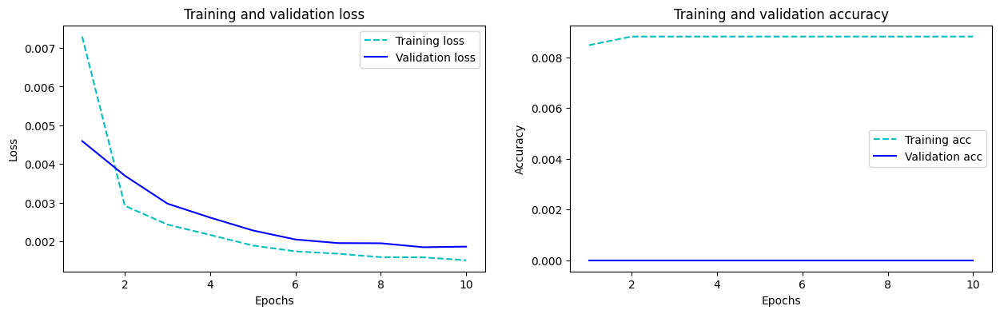

In [95]:
plot_curve(hist_2)

In [96]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_200,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.323865,0.328404,0.326759,0.330208
1,2021-12-16 09:11:00,0.112,0.145200,0.129802,0.130307,0.150293
2,2021-12-16 09:12:00,0.116,0.116782,0.116233,0.110283,0.121040
3,2021-12-16 09:13:00,0.112,0.117526,0.118118,0.113003,0.119847
4,2021-12-16 09:14:00,0.099,0.114210,0.114773,0.111251,0.116502
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.169692,0.166310,0.169176
289,2021-12-16 13:59:00,0.169,0.164358,0.169528,0.166064,0.168782
290,2021-12-16 14:00:00,0.147,0.165085,0.170405,0.166914,0.169507
291,2021-12-16 14:01:00,0.145,0.147931,0.150877,0.147889,0.152345


In [97]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [98]:
lstm_mse_error_100_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_100_drop_out)

Better MSE value is :  0.0017993547200843292


,Model,MSE error
0,model,0.001799
1,model_1,0.001856


In [127]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam frist layer unit 100 drop out 0.1', lstm_mse_error_100_drop_out]

In [128]:
mse_data

,Model,LSTM lag15
0,Lstm mse error unit 50 adam,0.001858
1,Lstm mse error unit 50 sgd,0.004738
2,Lstm mse error unit 50 rmsprop,0.001867
3,Lstm mse error adam 50 batch_size64,0.002184
4,Lstm mse error adam 50 learning rate 0.1,0.002401
5,Lstm mse error adam 50 learning rate 0.05,0.003924
6,Lstm mse error adam 50 learning rate 0.01,0.001864
7,Lstm mse error adam 50 learning rate 0.005,0.001923
8,Lstm mse error adam 50 learning rate 0.001,0.001864
9,Lstm mse error adam frist layer unit 100,0.001799


------------------------------------

### Add frist layer: units = 100 and Add second layer: unit = 50

In [102]:
model_3 = Sequential()
model_3.add(LSTM(units = 100, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 15s 20ms/step - loss: 0.0061 - accuracy: 0.0088 - val_loss: 0.0053 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 8s 16ms/step - loss: 0.0025 - accuracy: 0.0088 - val_loss: 0.0039 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 8s 17ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0027 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 8s 16ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 7s 16ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 7s 16ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 8s 17ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0011986043537035584
Last validation loss: 0.0018311991589143872
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


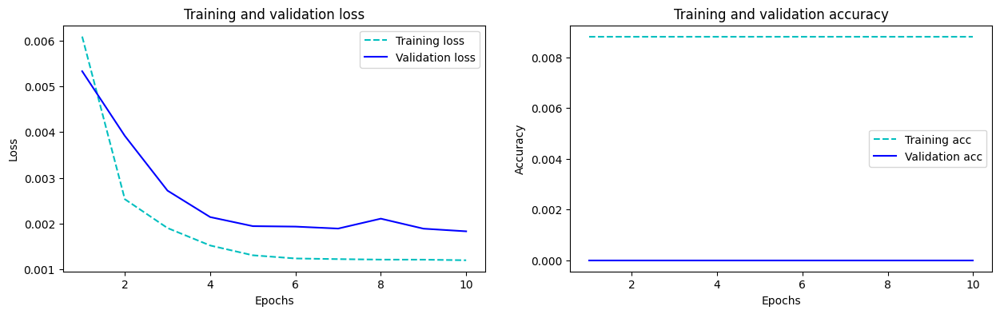

In [103]:
plot_curve(hist_3)

In [104]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 1s 13ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_200,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.323865,0.328404,0.326759,0.330208,0.326623
1,2021-12-16 09:11:00,0.112,0.145200,0.129802,0.130307,0.150293,0.147112
2,2021-12-16 09:12:00,0.116,0.116782,0.116233,0.110283,0.121040,0.124791
3,2021-12-16 09:13:00,0.112,0.117526,0.118118,0.113003,0.119847,0.122785
4,2021-12-16 09:14:00,0.099,0.114210,0.114773,0.111251,0.116502,0.119108
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.169692,0.166310,0.169176,0.170262
289,2021-12-16 13:59:00,0.169,0.164358,0.169528,0.166064,0.168782,0.170017
290,2021-12-16 14:00:00,0.147,0.165085,0.170405,0.166914,0.169507,0.170754
291,2021-12-16 14:01:00,0.145,0.147931,0.150877,0.147889,0.152345,0.153094


In [105]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [106]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_second_layer)

Better MSE value is :  0.0017993547200843292


,Model,MSE error
0,model,0.001799
1,model_1,0.001822


In [129]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 100 second layer unit 50', lstm_mse_error_second_layer]

---

### Add frist layer: units = 100 and Add second layer: unit = 100

In [107]:
model_4 = Sequential()
model_4.add(LSTM(units = 100, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_4.add(LSTM(units = 100))
model_4.add(Dense(units = 1))
model_4.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 21s 30ms/step - loss: 0.0053 - accuracy: 0.0088 - val_loss: 0.0048 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 10s 21ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 9s 20ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 9s 20ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 10s 22ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 11s 23ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 11s 23ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 

Last train loss: 0.001176121411845088
Last validation loss: 0.0018395337974652648
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


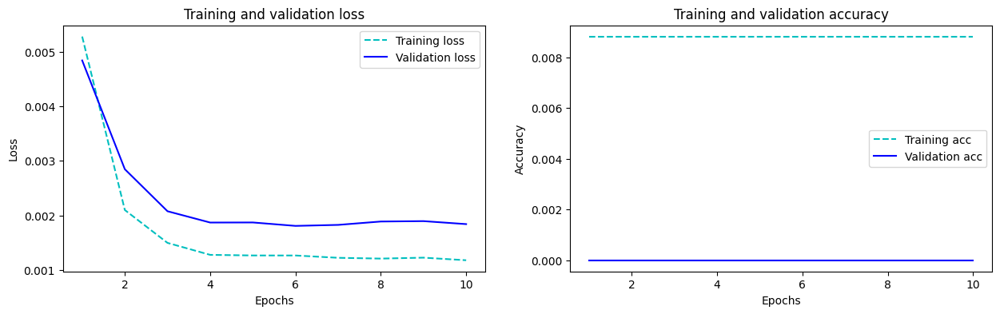

In [108]:
plot_curve(hist_4)

In [109]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_second_layer_100'] = predict_4
test3

10/10 [==============================] - 2s 15ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_200,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100
0,2021-12-16 09:10:00,0.111,0.323865,0.328404,0.326759,0.330208,0.326623,0.327833
1,2021-12-16 09:11:00,0.112,0.145200,0.129802,0.130307,0.150293,0.147112,0.131752
2,2021-12-16 09:12:00,0.116,0.116782,0.116233,0.110283,0.121040,0.124791,0.111085
3,2021-12-16 09:13:00,0.112,0.117526,0.118118,0.113003,0.119847,0.122785,0.112138
4,2021-12-16 09:14:00,0.099,0.114210,0.114773,0.111251,0.116502,0.119108,0.109674
...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.169692,0.166310,0.169176,0.170262,0.166361
289,2021-12-16 13:59:00,0.169,0.164358,0.169528,0.166064,0.168782,0.170017,0.166163
290,2021-12-16 14:00:00,0.147,0.165085,0.170405,0.166914,0.169507,0.170754,0.167023
291,2021-12-16 14:01:00,0.145,0.147931,0.150877,0.147889,0.152345,0.153094,0.147787


In [110]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [111]:
lstm_mse_error_second_layer_unit100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_second_layer_unit100)

Better MSE value is :  0.0017993547200843292


,Model,MSE error
0,model,0.001799
1,model_1,0.001830


In [130]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 100 second layer unit 100', lstm_mse_error_second_layer_unit100]
mse_data

,Model,LSTM lag15
0,Lstm mse error unit 50 adam,0.001858
1,Lstm mse error unit 50 sgd,0.004738
2,Lstm mse error unit 50 rmsprop,0.001867
3,Lstm mse error adam 50 batch_size64,0.002184
4,Lstm mse error adam 50 learning rate 0.1,0.002401
5,Lstm mse error adam 50 learning rate 0.05,0.003924
6,Lstm mse error adam 50 learning rate 0.01,0.001864
7,Lstm mse error adam 50 learning rate 0.005,0.001923
8,Lstm mse error adam 50 learning rate 0.001,0.001864
9,Lstm mse error adam frist layer unit 100,0.001799


---

### Add frist layer: units = 100 and change epochs from 10 to 30

In [112]:
model_5 = Sequential()
model_5.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
462/462 [==============================] - 10s 11ms/step - loss: 0.0075 - accuracy: 0.0086 - val_loss: 0.0055 - val_accuracy: 0.0000e+00
Epoch 2/30
462/462 [==============================] - 6s 12ms/step - loss: 0.0025 - accuracy: 0.0088 - val_loss: 0.0038 - val_accuracy: 0.0000e+00
Epoch 3/30
462/462 [==============================] - 6s 12ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 4/30
462/462 [==============================] - 5s 11ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 5/30
462/462 [==============================] - 5s 12ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 6/30
462/462 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/30
462/462 [==============================] - 5s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0011443124385550618
Last validation loss: 0.0018573844572529197
Last train accuracy: 0.00881176721304655
Last validation accuracy: 0.0


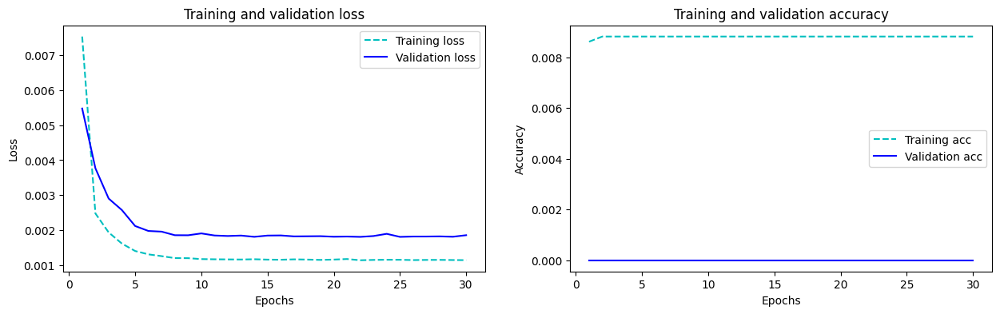

In [113]:
plot_curve(hist_5)

In [114]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch30'] = predict_5
test3

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_200,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30
0,2021-12-16 09:10:00,0.111,0.323865,0.328404,0.326759,0.330208,0.326623,0.327833,0.324136
1,2021-12-16 09:11:00,0.112,0.145200,0.129802,0.130307,0.150293,0.147112,0.131752,0.132458
2,2021-12-16 09:12:00,0.116,0.116782,0.116233,0.110283,0.121040,0.124791,0.111085,0.118246
3,2021-12-16 09:13:00,0.112,0.117526,0.118118,0.113003,0.119847,0.122785,0.112138,0.117714
4,2021-12-16 09:14:00,0.099,0.114210,0.114773,0.111251,0.116502,0.119108,0.109674,0.113977
...,...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.164715,0.169692,0.166310,0.169176,0.170262,0.166361,0.165932
289,2021-12-16 13:59:00,0.169,0.164358,0.169528,0.166064,0.168782,0.170017,0.166163,0.165826
290,2021-12-16 14:00:00,0.147,0.165085,0.170405,0.166914,0.169507,0.170754,0.167023,0.166640
291,2021-12-16 14:01:00,0.145,0.147931,0.150877,0.147889,0.152345,0.153094,0.147787,0.147019


In [115]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [118]:
lstm_mse_error_unit_100_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_unit_100_epoch30)

Better MSE value is :  0.0017993547200843292


,Model,MSE error
0,model,0.001799
1,model_1,0.001848


---

In [131]:
mse_data.loc[len(mse_data)] = ['Lstm mse error 100 epoch 30', lstm_mse_error_unit_100_epoch30]

In [132]:
mse_data

,Model,LSTM lag15
0,Lstm mse error unit 50 adam,0.001858
1,Lstm mse error unit 50 sgd,0.004738
2,Lstm mse error unit 50 rmsprop,0.001867
3,Lstm mse error adam 50 batch_size64,0.002184
4,Lstm mse error adam 50 learning rate 0.1,0.002401
5,Lstm mse error adam 50 learning rate 0.05,0.003924
6,Lstm mse error adam 50 learning rate 0.01,0.001864
7,Lstm mse error adam 50 learning rate 0.005,0.001923
8,Lstm mse error adam 50 learning rate 0.001,0.001864
9,Lstm mse error adam frist layer unit 100,0.001799


In [133]:
minimum_mse= mse_data.loc[mse_data['LSTM lag15'].idxmin()]
minimum_mse

Model         Lstm mse error adam frist layer unit 100
LSTM lag15                                    0.001799
Name: 9, dtype: object

In [134]:
data_mse = pd.read_csv('data_lstm_mse.csv')
data_mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN


In [135]:
mse = pd.merge(data_mse,mse_data, on = 'Model', how='outer')
mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882,0.001867
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799


In [ ]:
mse.dtypes

In [137]:
# mse["LSTM lag1", "LSTM lag5"] = pd.to_numeric(mse["LSTM lag1", "LSTM lag5"])
minimum_mse1= mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15']].idxmin()
minimum_mse1

LSTM lag1      0
LSTM lag5     17
LSTM lag10     5
LSTM lag15     9
dtype: int64

In [136]:
minimum_mse1= mse.loc[mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15']].idxmin()]
minimum_mse1

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858
17,Lstm mse error adam 100 second layer unit 100,NaN,0.001801,NaN,0.001830
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799


In [138]:
mse.to_csv('data_lstm_mse.csv')

In [139]:
model_1.save('model_lag15.h5')